In [1]:
import glob
import os
from lsst import afw
#print(afw.version.__version__)
from lsst.daf.persistence import Butler
from lsst.eotest.sensor import MaskedCCD, makeAmplifierGeometry

from exploreRun import exploreRun
from lsst.eo_utils.base.image_utils import get_ccd_from_id,\
    get_amp_list, get_data_as_read, sort_sflats

from lsst.eo_utils.base.data_access import get_data_for_run

import lsst.eotest.image_utils as imutil
import pylab

from astropy.io import fits
from astropy.stats import mad_std

import scipy
from scipy import signal
from scipy.fftpack import fft, fftshift

import math
from scipy.ndimage import gaussian_filter

from mytool import plotonesensor_E2V, plotonesensor_E2V_smooth, create_combined_E2V, plotfullraft, plotonesensor_E2V_andsave, internaladjustment
import numpy as np
import numpy

import matplotlib.pyplot as plt

%matplotlib inline

20.0.0-4-gde602ef96+5


In [2]:

# bottom row
superbiaspath_S00 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S00_superbias_normal.fits" # bottom left
superdarkpath_S00 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S00_superdark_normal.fits"
qeflatpath_S00 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S00/*_lambda_flat_*")

superbiaspath_S01 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S01_superbias_normal.fits"
superdarkpath_S01 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S01_superdark_normal.fits"
qeflatpath_S01 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S01/*_lambda_flat_*")

superbiaspath_S02 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S02_superbias_normal.fits"
superdarkpath_S02 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S02_superdark_normal.fits"
qeflatpath_S02 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S02/*_lambda_flat_*")

# middle row
superbiaspath_S10 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S10_superbias_normal.fits"
superdarkpath_S10 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S10_superdark_normal.fits"
qeflatpath_S10 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S10/*_lambda_flat_*")

superbiaspath_S11 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S11_superbias_normal.fits"
superdarkpath_S11 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S11_superdark_normal.fits"
qeflatpath_S11 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S11/*_lambda_flat_*")

superbiaspath_S12 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S12_superbias_normal.fits"
superdarkpath_S12 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S12_superdark_normal.fits"
qeflatpath_S12 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S12/*_lambda_flat_*")

# top row
superbiaspath_S20 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S20_superbias_normal.fits"
superdarkpath_S20 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S20_superdark_normal.fits"
qeflatpath_S20 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S20/*_lambda_flat_*")

superbiaspath_S21 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S21_superbias_normal.fits"
superdarkpath_S21 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S21_superdark_normal.fits"
qeflatpath_S21 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S21/*_lambda_flat_*")

superbiaspath_S22 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superbias/RTM-024/RTM-024-11351-S22_superbias_normal.fits"  # top right
superdarkpath_S22 = "/gpfs/slac/lsst/fs1/u/echarles/DATA/analysis/ts8/superdark/RTM-024/RTM-024-11351-S22_superdark_normal.fits" 
qeflatpath_S22 = glob.glob("/gpfs/slac/lsst/fs3/g/data/jobHarness/jh_stage/LCA-11021_RTM/LCA-11021_RTM-024/11351/qe_raft_acq/v0/88290/S22/*_lambda_flat_*")

# list of file path for each sensor, will use to create combined images
superbiaspath_list = [superbiaspath_S20, superbiaspath_S21, superbiaspath_S22, superbiaspath_S10, superbiaspath_S11, superbiaspath_S12, superbiaspath_S00, superbiaspath_S01, superbiaspath_S02]
superdarkpath_list = [superdarkpath_S20, superdarkpath_S21, superdarkpath_S22, superdarkpath_S10, superdarkpath_S11, superdarkpath_S12, superdarkpath_S00, superdarkpath_S01, superdarkpath_S02]
qeflatpath_list = [qeflatpath_S20, qeflatpath_S21, qeflatpath_S22, qeflatpath_S10, qeflatpath_S11, qeflatpath_S12, qeflatpath_S00, qeflatpath_S01, qeflatpath_S02]

In [3]:
# BANDS: ugrizy

wavelengths_list = [365, 466.6, 622.6, 759.9, 845.7, 950.5]
width_of_wavelength_list = [12, 25, 18, 28, 32, 60]
width_of_wavelength_list_converted = []
for num in width_of_wavelength_list:
    z = num / 2.355
    width_of_wavelength_list_converted.append(z)
mu = wavelengths_list[2]     # RED band
sigma = width_of_wavelength_list_converted[2]
a = 1    # to normalize
x = numpy.arange(300,1100,1)  
y = a*numpy.exp(-(x-mu)**2/(2*sigma**2))

wls_list = []
weights_list = []
num_CCDs = 9
for i in range(num_CCDs):
    qeflatpath_list[i].sort()
    # array of wavelengths
    wls = numpy.array([ get_ccd_from_id(None, aqeflatpath, []).md.md["MONOWL"] for aqeflatpath in qeflatpath_list[i]])
    wls_list.append(wls)
    # 
    weights = numpy.interp(wls, x, y)
    weights_list.append(weights)

In [4]:
# loading all 9 CCOB filepaths, CENTER POSITIONS
fnameS00= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S00_red_-42.185_-42.365.fits"
fnameS01= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S01_red_-42.315_-0.085.fits"
fnameS02= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S02_red_-42.365_42.185.fits"
fnameS10= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S10_red_10.095_-52.555.fits"
fnameS11= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S11_red_-10.005_10.245.fits"
fnameS12= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S12_red_-10.105_52.525.fits"
fnameS20= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S20_red_42.365_-42.185.fits"
fnameS21= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S21_red_42.285_0.105.fits" 
fnameS22= "/gpfs/slac/lsst/fs1/u/combet/DATA/CCOB_QE/fits/QE_R22_S22_red_42.205_42.365.fits"

file_list = [fnameS20, fnameS21, fnameS22, fnameS10, fnameS11, fnameS12, fnameS00, fnameS01, fnameS02]

def create_ccob(img_list, i):
    num_ch = 16
    red_arr = [None] * num_ch
    normedimg_arr = [None] * num_ch
    MEDIAN = None

    fname = file_list[i]     
    ccob_red = get_ccd_from_id(None, file_list[i], [])

    # reading in files in CCOB testing at red LED for each of 16 channels 
    for ch in range(num_ch):    
        red = get_data_as_read(ccob_red,ch + 1,["imaging"])["imaging"]    # QE data array for CCOBr flat field image
        MEDIAN = numpy.median(red)                                        # median (not mean, avoiding outliers) of QE data array for CCOBr, will normalize COMBINED with this
        normedimg = img_list[ch] / numpy.median(img_list[ch]) * MEDIAN    # normalizing COMBINED against the CCOB amp-by-amp to the level of the CCOB median 
        normedimg_arr[ch] = normedimg                                     # adding data at this amp to data array
        red_arr[ch] = red
    return normedimg_arr, red_arr

In [5]:
normedimg_arr_list = []
red_arr_list = []
img_list_list = []
sensor_label = ['S20', 'S21', 'S22', 'S10', 'S11', 'S12', 'S00', 'S01', 'S02']
num_CCDS = 9
raft = 'R02'

for i in range(num_CCDs):
    title = 'COMBINED ' + str(raft) + '_' + str(sensor_label[i])
    img_list = create_combined_E2V(superdarkpath_list[i], superbiaspath_list[i], qeflatpath_list[i], weights_list[i], title)    # create_combined returns img_list at end of function
    img_list_list.append(img_list)                                                                                                                            

for i in range(len(file_list)):
    create_ccob(img_list_list[i], i)
    normedimg_arr, red_arr = create_ccob(img_list_list[i], i)
    normedimg_arr_list.append(normedimg_arr)          # creates lists of stored QE flat data for each CCD (of 9) to make COMBINED
    red_arr_list.append(red_arr)                      # and CCOB red band

[1.         1.00095773 0.99964803 0.99915748 0.9990099  0.99915889
 0.99867447 0.99779391 0.99564318 0.99449604 0.99486854 0.99521294
 0.99413084 0.99298385 0.9940511  0.99332262]
[1.         1.00095773 0.99964803 0.99915748 0.9990099  0.99915889
 0.99867447 0.99779391 0.99902418 0.99787315 0.99824691 0.99859248
 0.99750671 0.99635582 0.99742669 0.99669574]


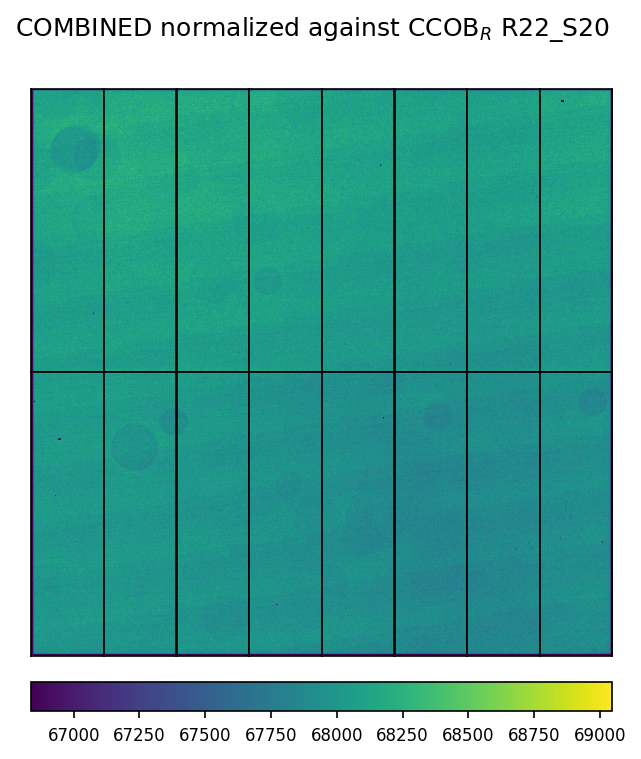

[1.         1.00095773 0.99964803 0.99915748 0.9990099  0.99915889
 0.99867447 0.99779391 0.99564318 0.99449604 0.99486854 0.99521294
 0.99413084 0.99298385 0.9940511  0.99332262]
[1.         1.00060153 0.99970728 0.99964883 0.99997201 1.00088131
 1.00074935 0.99989851 0.99842976 0.99755632 0.99824402 0.9991201
 0.99884116 0.99856348 0.99990147 0.99938094]
[1.         1.00060153 0.99970728 0.99964883 0.99997201 1.00088131
 1.00074935 0.99989851 0.99975972 0.99888511 0.99957373 1.00045097
 1.00017166 0.99989361 1.00123338 1.00071216]


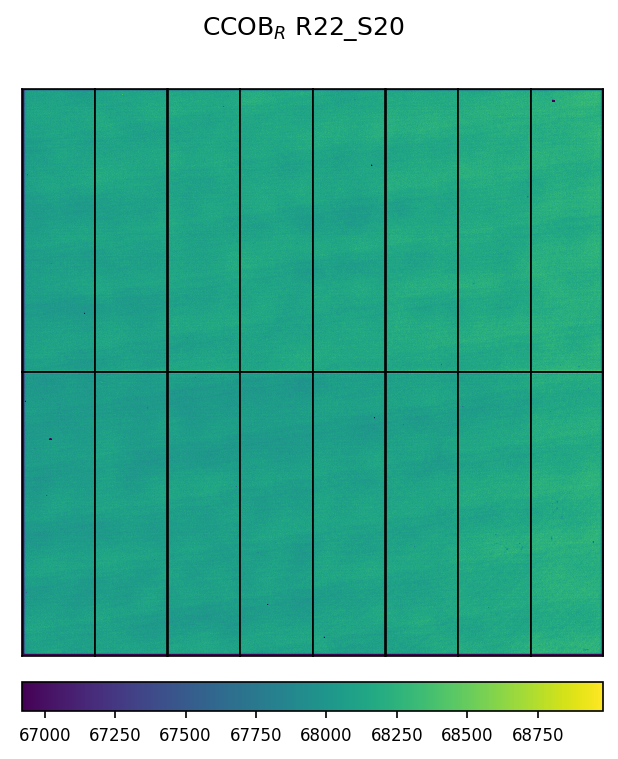

[1.         1.00060153 0.99970728 0.99964883 0.99997201 1.00088131
 1.00074935 0.99989851 0.99842976 0.99755632 0.99824402 0.9991201
 0.99884116 0.99856348 0.99990147 0.99938094]
[1.         0.9993847  1.00247699 1.00152759 1.00114649 1.00265061
 1.00066978 1.00245649 1.00176135 1.00066179 1.00290572 1.00242899
 1.00421096 1.00557399 1.00199576 1.00035097]
[1.         0.9993847  1.00247699 1.00152759 1.00114649 1.00265061
 1.00066978 1.00245649 0.99640671 0.99531303 0.99754497 0.99707079
 0.99884323 1.00019897 0.99663987 0.99500387]


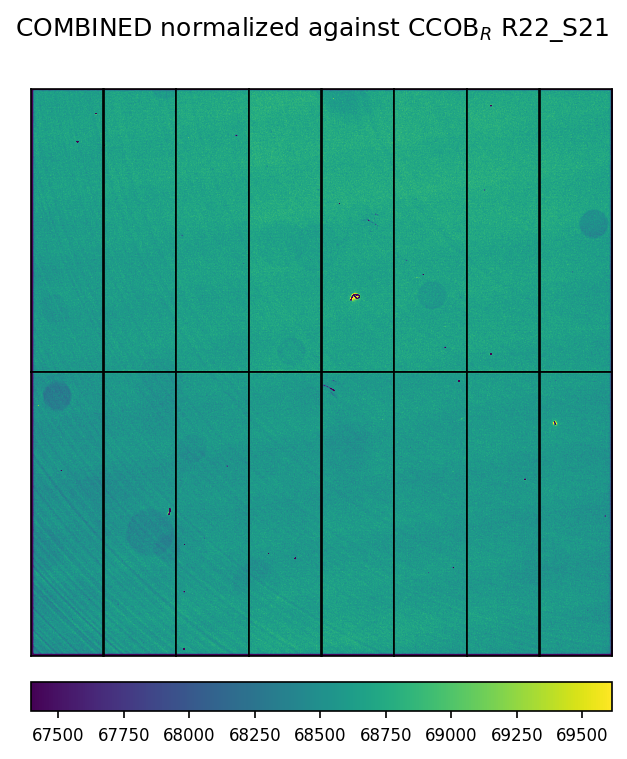

[1.         0.9993847  1.00247699 1.00152759 1.00114649 1.00265061
 1.00066978 1.00245649 1.00176135 1.00066179 1.00290572 1.00242899
 1.00421096 1.00557399 1.00199576 1.00035097]
[1.         0.99895835 1.00146283 1.0002758  0.99975107 1.00114273
 0.99915276 1.00135555 1.00088219 0.99948633 1.00104907 1.00016069
 1.00192098 1.00332557 0.99988236 0.99864702]
[1.         0.99895835 1.00146283 1.0002758  0.99975107 1.00114273
 0.99915276 1.00135555 0.99771385 0.99632241 0.99788021 0.99699464
 0.99874935 1.0001495  0.99671719 0.99548576]


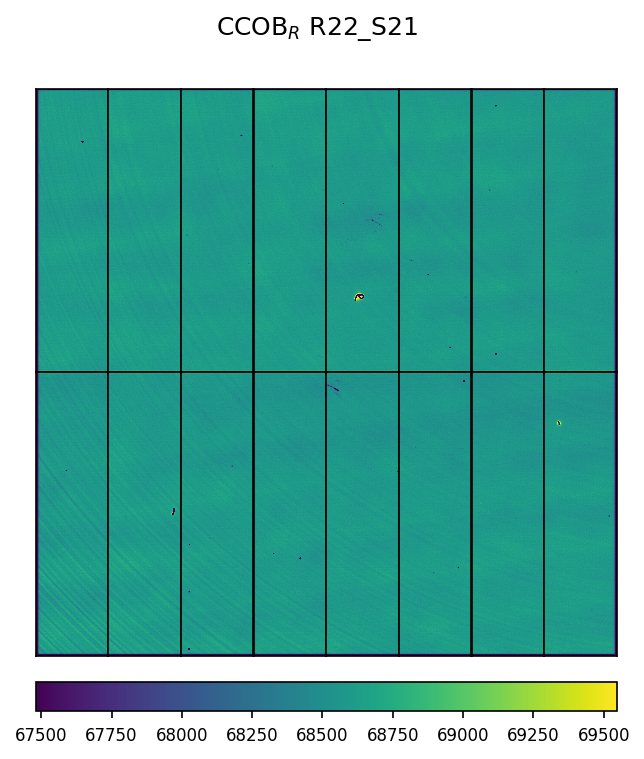

[1.         0.99895835 1.00146283 1.0002758  0.99975107 1.00114273
 0.99915276 1.00135555 1.00088219 0.99948633 1.00104907 1.00016069
 1.00192098 1.00332557 0.99988236 0.99864702]
[1.         1.00178456 1.0014712  1.00261765 1.00260893 1.0040611
 1.00460271 1.00534808 1.00241483 1.00074713 1.00037999 1.00226183
 1.00590534 1.00642708 1.00949365 1.01037599]
[1.         1.00178456 1.0014712  1.00261765 1.00260893 1.0040611
 1.00460271 1.00534808 0.99890203 0.99724018 0.99687432 0.99874956
 1.00238031 1.00290022 1.00595605 1.0068353 ]


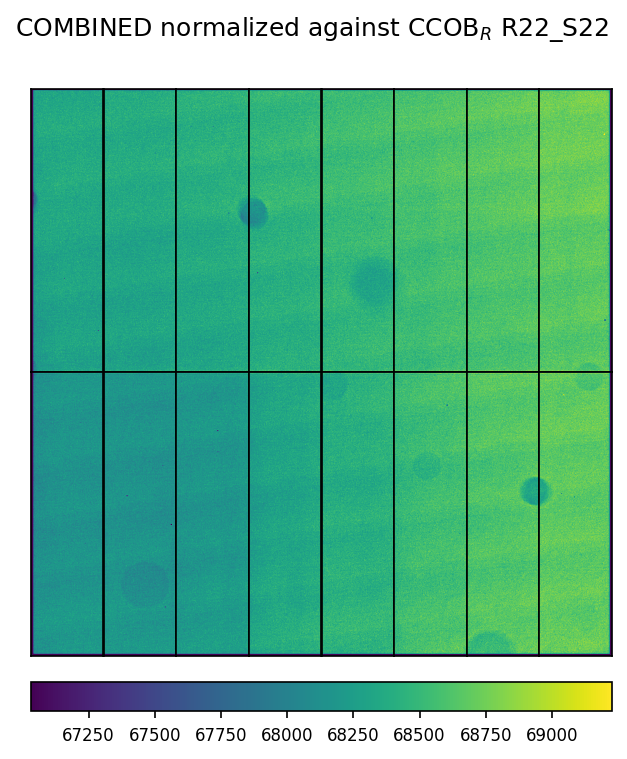

[1.         1.00178456 1.0014712  1.00261765 1.00260893 1.0040611
 1.00460271 1.00534808 1.00241483 1.00074713 1.00037999 1.00226183
 1.00590534 1.00642708 1.00949365 1.01037599]
[1.         1.00145495 1.00066213 1.00110254 1.00045965 1.00078357
 1.00050536 1.00054925 0.99737702 0.99590627 0.99500363 0.99496745
 0.99726681 0.99609296 0.99792137 0.99822853]
[1.         1.00145495 1.00066213 1.00110254 1.00045965 1.00078357
 1.00050536 1.00054925 1.00103666 0.99956051 0.99865456 0.99861825
 1.00092605 0.99974788 1.00158301 1.00189129]


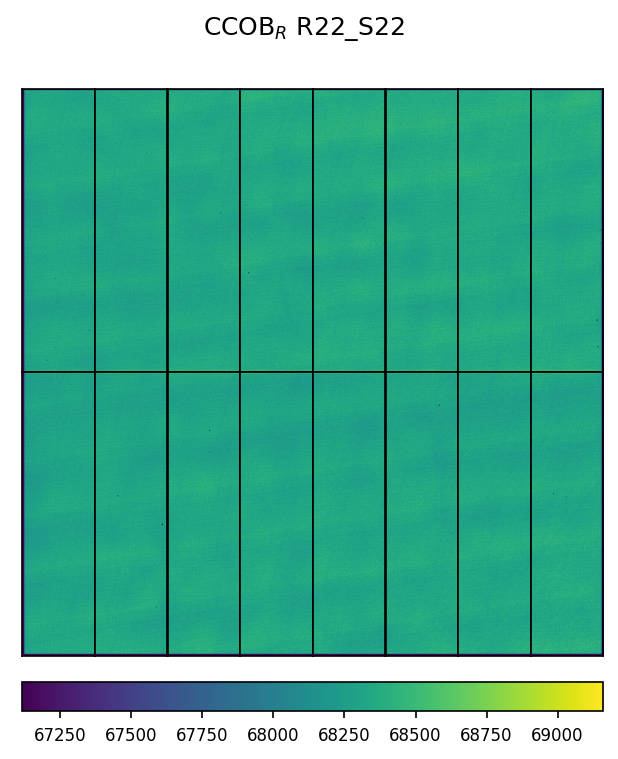

[1.         1.00145495 1.00066213 1.00110254 1.00045965 1.00078357
 1.00050536 1.00054925 0.99737702 0.99590627 0.99500363 0.99496745
 0.99726681 0.99609296 0.99792137 0.99822853]
[1.         1.00120783 0.99963439 0.99910953 0.99762276 0.99768746
 0.9957561  0.99852794 0.99582456 0.99179431 0.98634905 0.99048653
 0.99144695 0.99420645 0.99521824 0.99793982]
[1.         1.00120783 0.99963439 0.99910953 0.99762276 0.99768746
 0.9957561  0.99852794 1.00147108 0.99741797 0.99194184 0.99610278
 0.99706865 0.99984379 1.00086132 1.00359833]


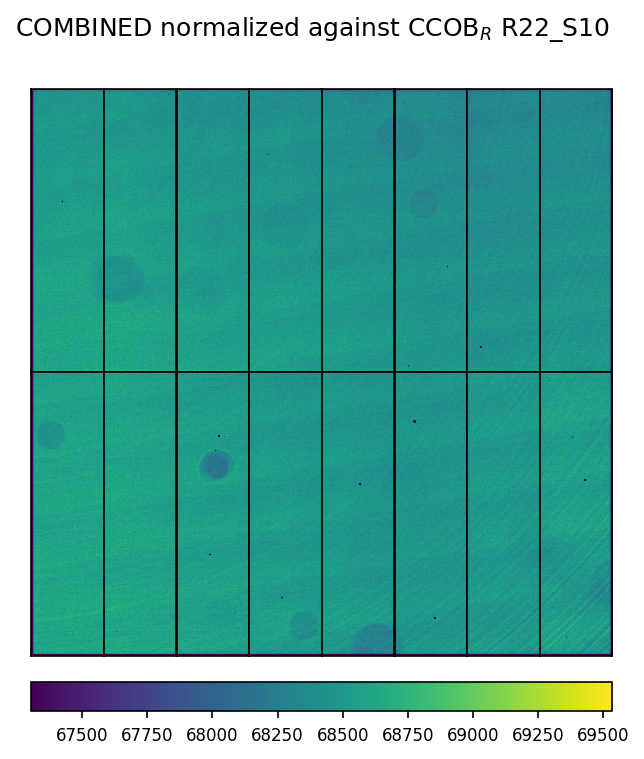

[1.         1.00120783 0.99963439 0.99910953 0.99762276 0.99768746
 0.9957561  0.99852794 0.99582456 0.99179431 0.98634905 0.99048653
 0.99144695 0.99420645 0.99521824 0.99793982]
[1.         1.00179327 1.00082152 1.000763   0.99960949 1.00039763
 0.99853567 1.00125585 1.00060511 0.99670425 0.99213273 0.99677441
 0.99817619 1.00129948 1.00214005 1.00468846]
[1.         1.00179327 1.00082152 1.000763   0.99960949 1.00039763
 0.99853567 1.00125585 1.00006286 0.99616411 0.99159507 0.99623423
 0.99763525 1.00075685 1.00159696 1.004144  ]


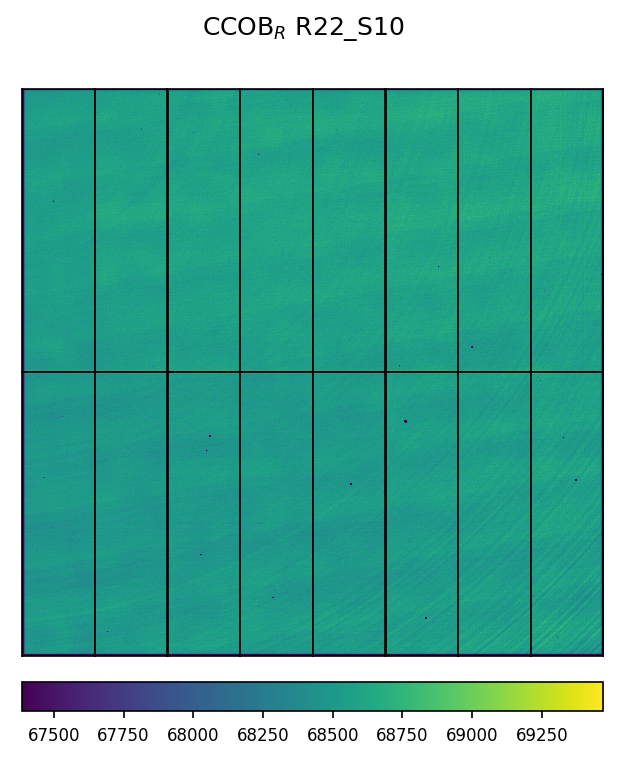

[1.         1.00179327 1.00082152 1.000763   0.99960949 1.00039763
 0.99853567 1.00125585 1.00060511 0.99670425 0.99213273 0.99677441
 0.99817619 1.00129948 1.00214005 1.00468846]
[1.         0.99951899 0.99953865 1.0019632  1.00174307 1.00241706
 1.00273755 1.0032922  0.99640852 0.99663515 0.99903484 0.99720877
 0.99945458 0.99966594 0.9985613  0.99980501]
[1.         0.99951899 0.99953865 1.0019632  1.00174307 1.00241706
 1.00273755 1.0032922  1.00033637 1.0005639  1.00297305 1.00113978
 1.00339445 1.00360664 1.00249764 1.00374625]


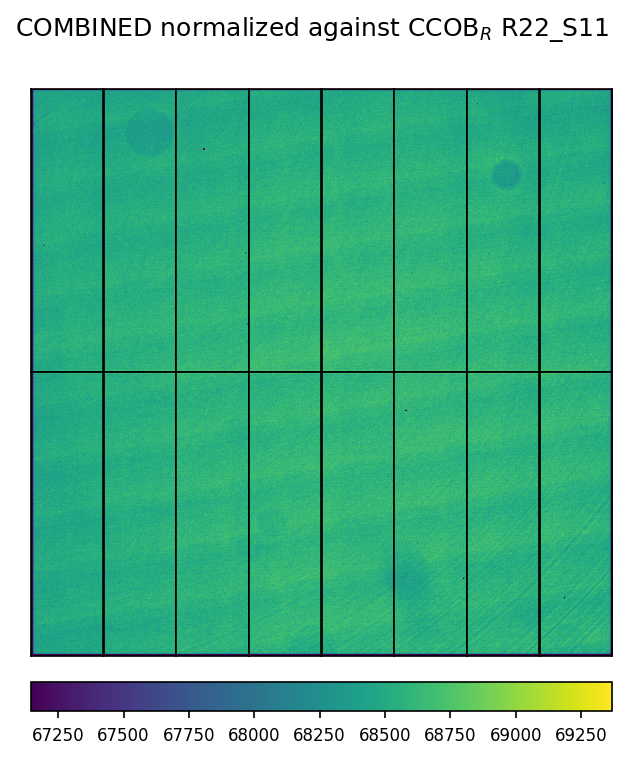

[1.         0.99951899 0.99953865 1.0019632  1.00174307 1.00241706
 1.00273755 1.0032922  0.99640852 0.99663515 0.99903484 0.99720877
 0.99945458 0.99966594 0.9985613  0.99980501]
[1.         0.99905425 0.99882035 1.00095644 1.00072292 1.00135042
 1.00174386 1.00243135 0.99634502 0.99595211 0.99790707 0.99576228
 0.99775224 0.99826274 0.99720052 0.9985481 ]
[1.         0.99905425 0.99882035 1.00095644 1.00072292 1.00135042
 1.00174386 1.00243135 0.99952934 0.99913518 1.00109638 0.99894474
 1.00094106 1.00145318 1.00038758 1.00173946]


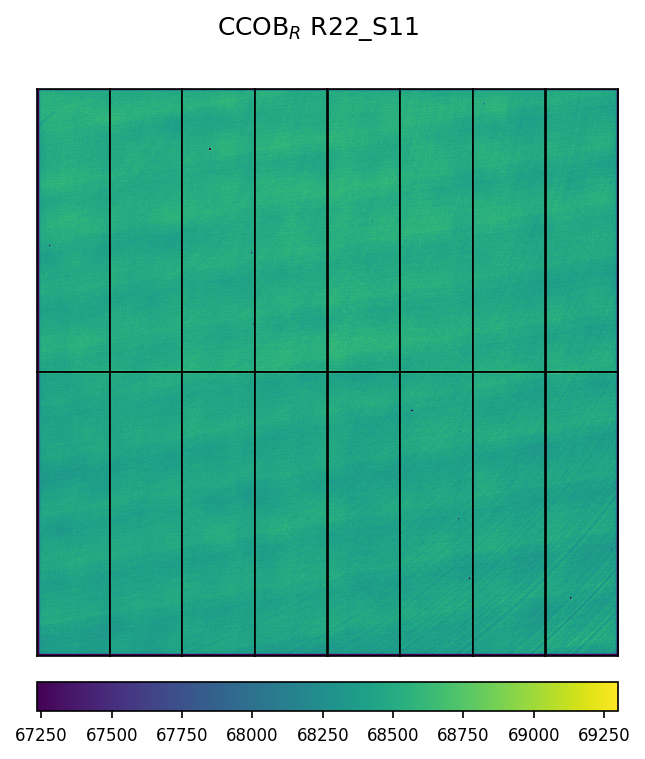

[1.         0.99905425 0.99882035 1.00095644 1.00072292 1.00135042
 1.00174386 1.00243135 0.99634502 0.99595211 0.99790707 0.99576228
 0.99775224 0.99826274 0.99720052 0.9985481 ]
[1.         0.99884194 0.99861023 0.99943639 1.00055442 1.00093908
 1.00323244 1.00270562 1.00265817 1.00289053 1.00349499 1.00496256
 1.00491063 1.00625976 1.00676429 1.00929122]
[1.         0.99884194 0.99861023 0.99943639 1.00055442 1.00093908
 1.00323244 1.00270562 0.99824514 0.99847648 0.99907828 1.0005394
 1.00048769 1.00183088 1.00233319 1.004849  ]


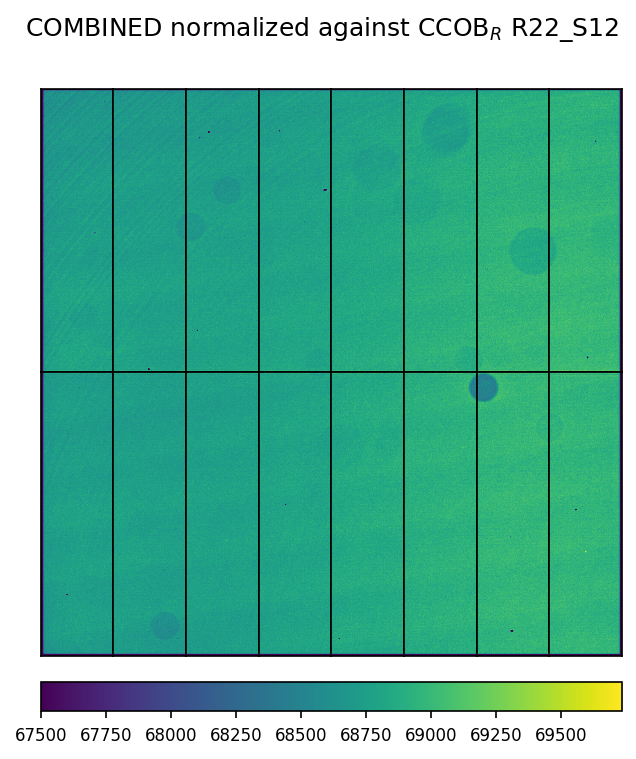

[1.         0.99884194 0.99861023 0.99943639 1.00055442 1.00093908
 1.00323244 1.00270562 1.00265817 1.00289053 1.00349499 1.00496256
 1.00491063 1.00625976 1.00676429 1.00929122]
[1.         0.99859786 0.99828049 0.99849994 0.99886203 0.998167
 0.99912225 0.99789095 0.997778   0.99799579 0.9983734  0.99927077
 0.99824972 0.99865599 0.99840164 1.00021203]
[1.         0.99859786 0.99828049 0.99849994 0.99886203 0.998167
 0.99912225 0.99789095 0.99704703 0.99726465 0.99764199 0.99853871
 0.9975184  0.99792437 0.99767021 0.99947928]


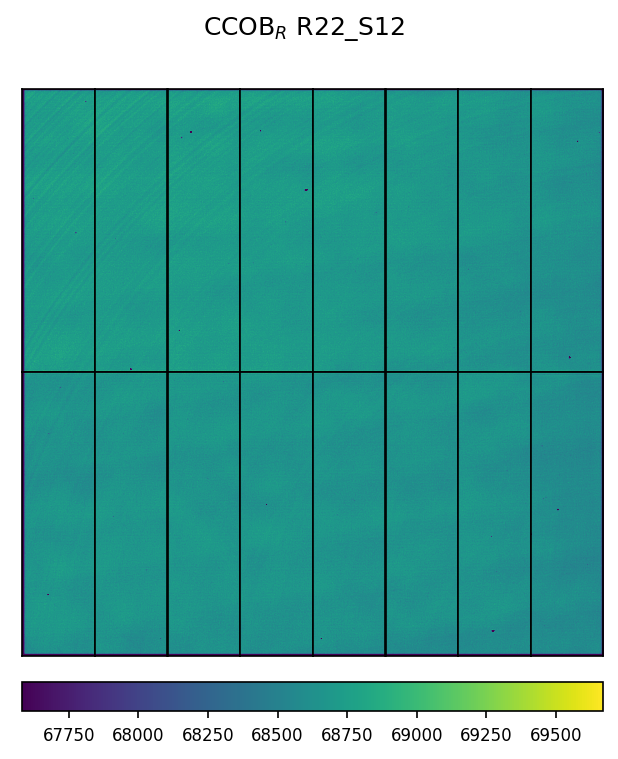

[1.         0.99859786 0.99828049 0.99849994 0.99886203 0.998167
 0.99912225 0.99789095 0.997778   0.99799579 0.9983734  0.99927077
 0.99824972 0.99865599 0.99840164 1.00021203]
[1.         1.00015306 1.00016165 1.00113026 0.99857308 0.99807043
 0.99920788 0.99894874 1.00192298 1.00120456 1.00003645 1.00110568
 0.99895885 0.997943   0.99865583 0.99904655]
[1.         1.00015306 1.00016165 1.00113026 0.99857308 0.99807043
 0.99920788 0.99894874 1.00322797 1.00250861 1.00133898 1.0024096
 1.00025998 0.9992428  0.99995656 1.00034779]


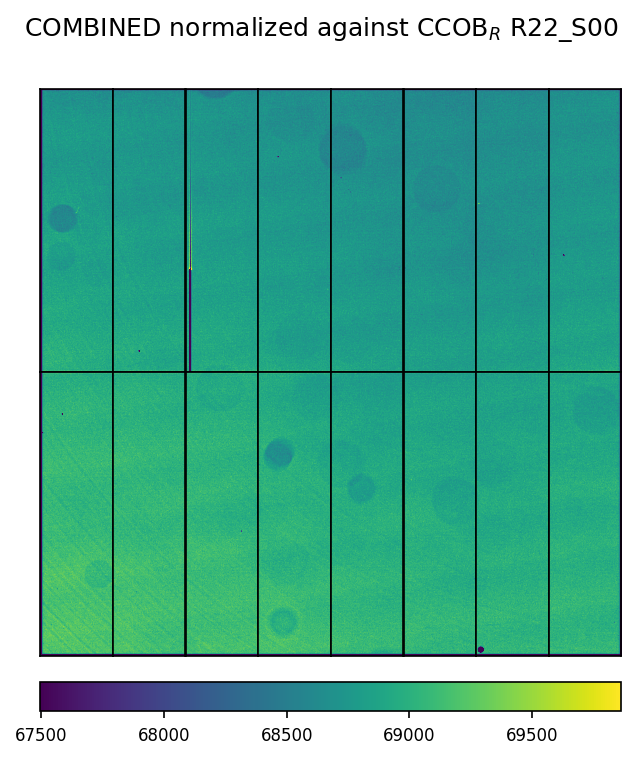

[1.         1.00015306 1.00016165 1.00113026 0.99857308 0.99807043
 0.99920788 0.99894874 1.00192298 1.00120456 1.00003645 1.00110568
 0.99895885 0.997943   0.99865583 0.99904655]
[1.         1.00063276 1.00082111 1.00234323 1.00014691 0.99995776
 1.00103322 1.00059754 1.0043946  1.0042059  1.00325719 1.00500929
 1.00348308 1.00295757 1.00392148 1.00457898]
[1.         1.00063276 1.00082111 1.00234323 1.00014691 0.99995776
 1.00103322 1.00059754 0.99887687 0.99868921 0.99774571 0.99948819
 0.99797036 0.99744774 0.99840635 0.99906024]


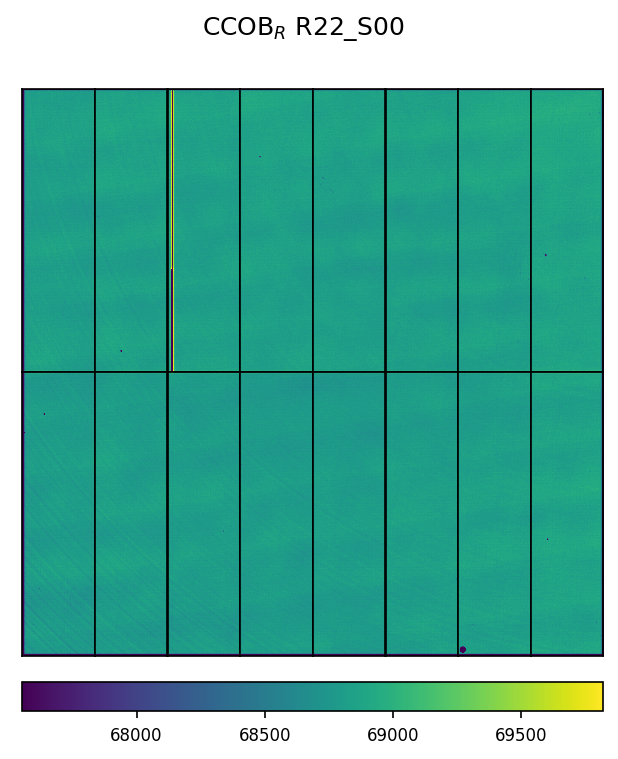

[1.         1.00063276 1.00082111 1.00234323 1.00014691 0.99995776
 1.00103322 1.00059754 1.0043946  1.0042059  1.00325719 1.00500929
 1.00348308 1.00295757 1.00392148 1.00457898]
[1.         1.00161505 1.00238077 1.00301289 1.00234845 1.0015775
 1.00221867 1.00238999 1.00830328 1.00742859 1.009457   1.00944099
 1.00987901 1.01103472 1.01038365 1.009407  ]
[1.         1.00161505 1.00238077 1.00301289 1.00234845 1.0015775
 1.00221867 1.00238999 1.0048591  1.0039874  1.00600887 1.00599292
 1.00642944 1.00758121 1.00693236 1.00595905]


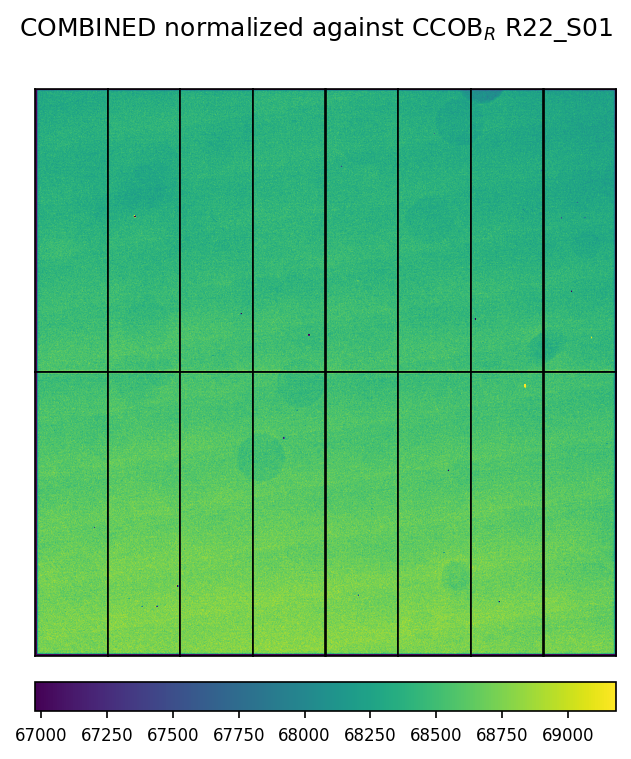

[1.         1.00161505 1.00238077 1.00301289 1.00234845 1.0015775
 1.00221867 1.00238999 1.00830328 1.00742859 1.009457   1.00944099
 1.00987901 1.01103472 1.01038365 1.009407  ]
[1.         1.00140548 1.00150778 1.00182333 1.00104282 1.00029173
 1.00113145 1.00180741 1.00826662 1.00707116 1.00872464 1.00859141
 1.00881408 1.00995318 1.00934566 1.00866403]
[1.         1.00140548 1.00150778 1.00182333 1.00104282 1.00029173
 1.00113145 1.00180741 1.00058233 0.99939598 1.00103686 1.00090464
 1.00112561 1.00225604 1.00165315 1.00097671]


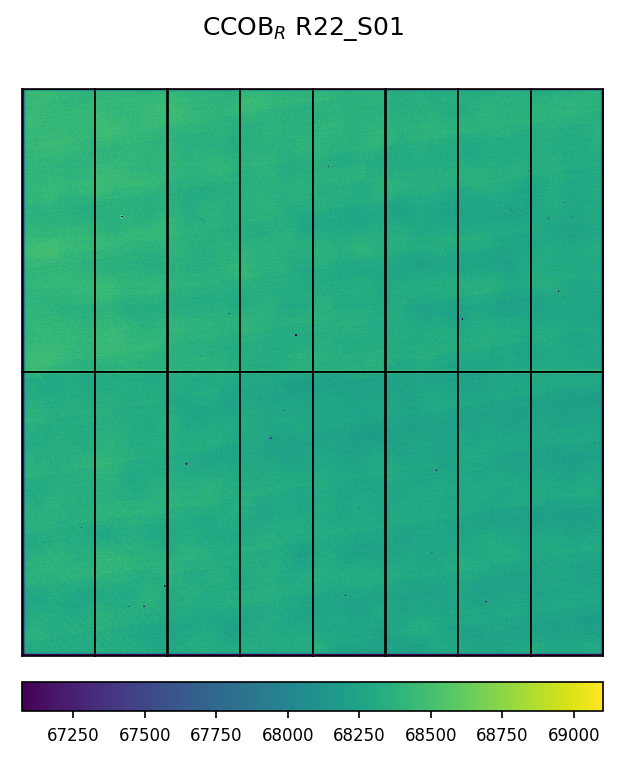

[1.         1.00140548 1.00150778 1.00182333 1.00104282 1.00029173
 1.00113145 1.00180741 1.00826662 1.00707116 1.00872464 1.00859141
 1.00881408 1.00995318 1.00934566 1.00866403]
[1.         1.00140381 1.00002716 1.0008254  1.00284099 1.00501102
 1.00425061 1.00378013 1.01148204 1.00921565 1.00848081 1.01041035
 1.01131987 1.01321577 1.01493067 1.01385919]
[1.         1.00140381 1.00002716 1.0008254  1.00284099 1.00501102
 1.00425061 1.00378013 1.00690827 1.00465213 1.00392062 1.00584143
 1.00674683 1.00863417 1.01034131 1.00927468]


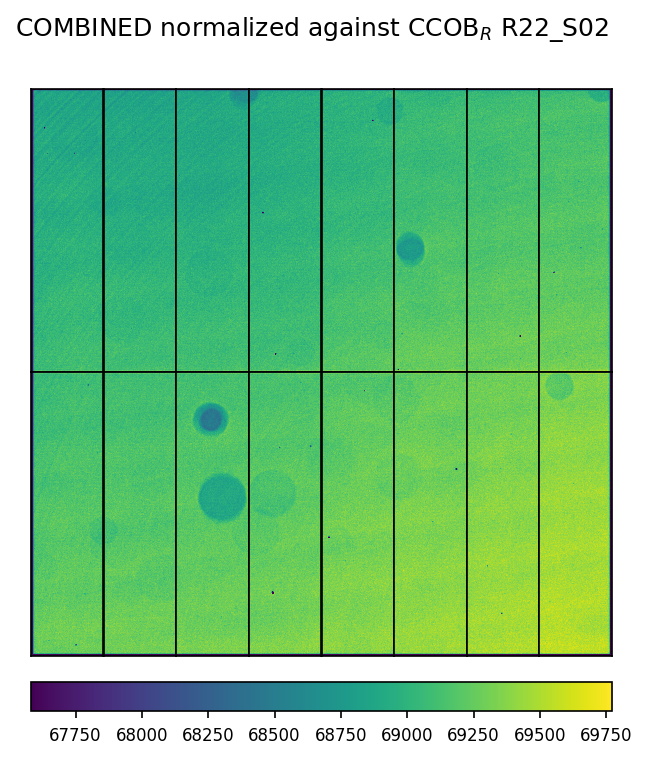

[1.         1.00140381 1.00002716 1.0008254  1.00284099 1.00501102
 1.00425061 1.00378013 1.01148204 1.00921565 1.00848081 1.01041035
 1.01131987 1.01321577 1.01493067 1.01385919]
[1.         1.00140905 0.99983847 1.00007136 1.00102797 1.00251234
 1.00099667 1.00018667 1.00764388 1.0049718  1.00435998 1.00508649
 1.00510111 1.00624021 1.00706021 1.00533844]
[1.         1.00140905 0.99983847 1.00007136 1.00102797 1.00251234
 1.00099667 1.00018667 1.00330741 1.00064683 1.00003764 1.00076103
 1.00077558 1.00190978 1.00272625 1.00101189]


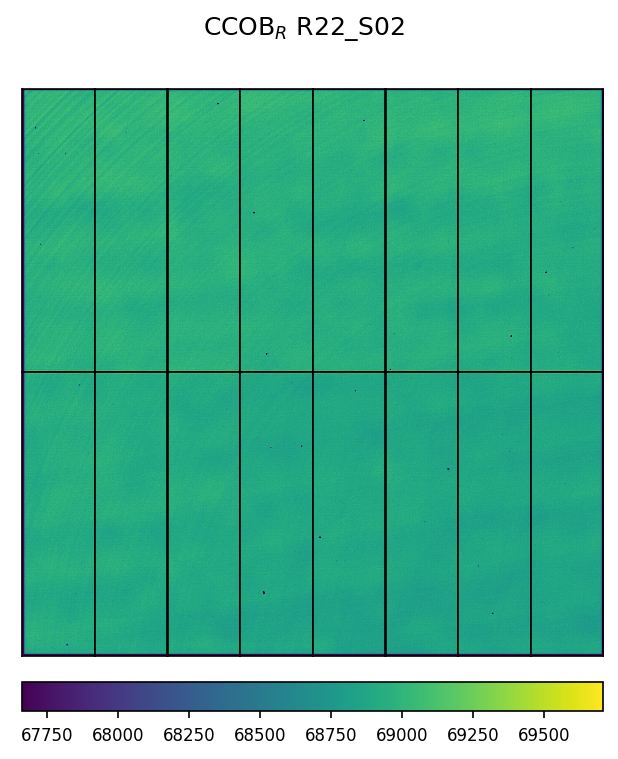

[1.         1.00140905 0.99983847 1.00007136 1.00102797 1.00251234
 1.00099667 1.00018667 1.00764388 1.0049718  1.00435998 1.00508649
 1.00510111 1.00624021 1.00706021 1.00533844]


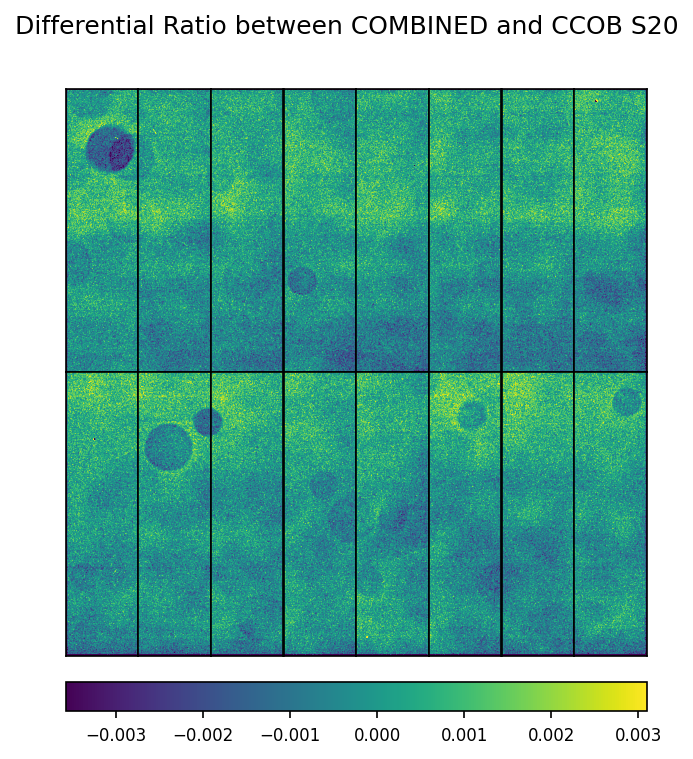

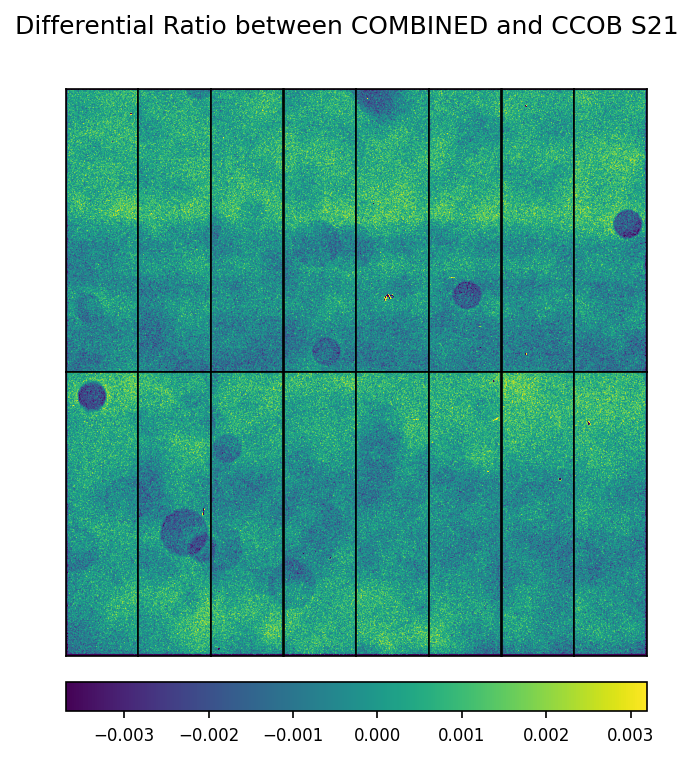

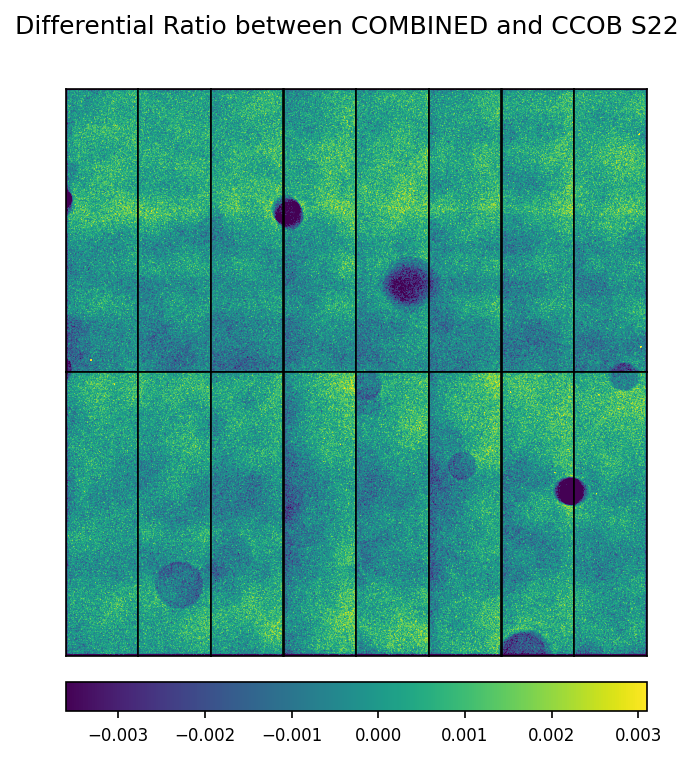

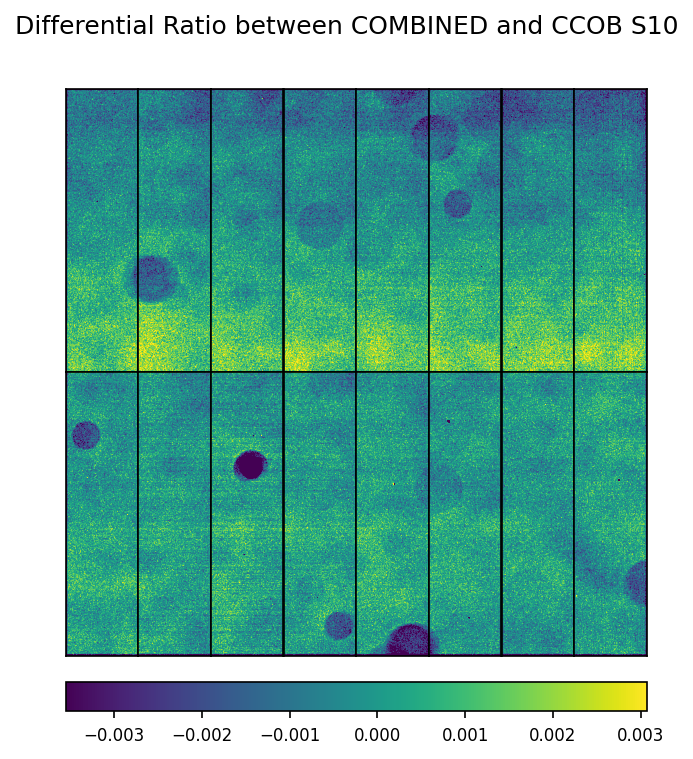

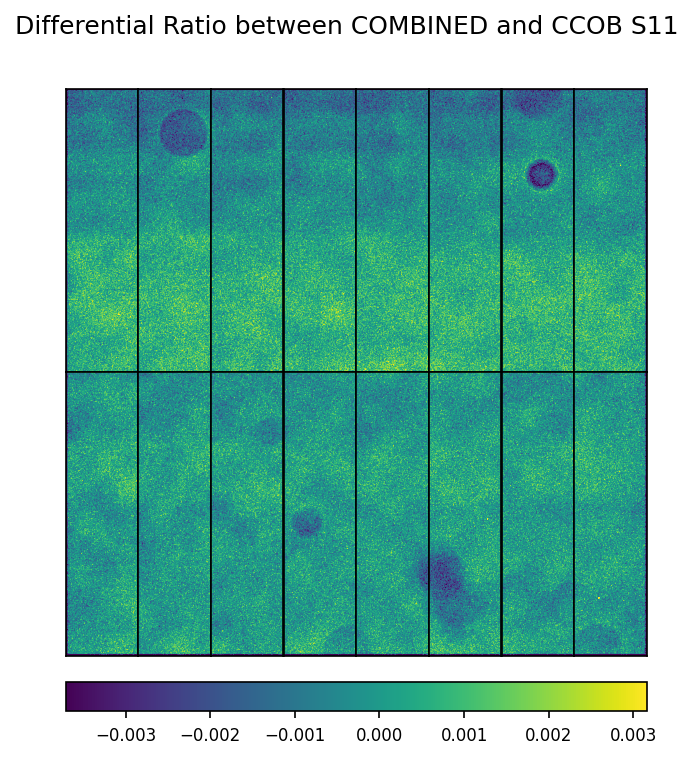

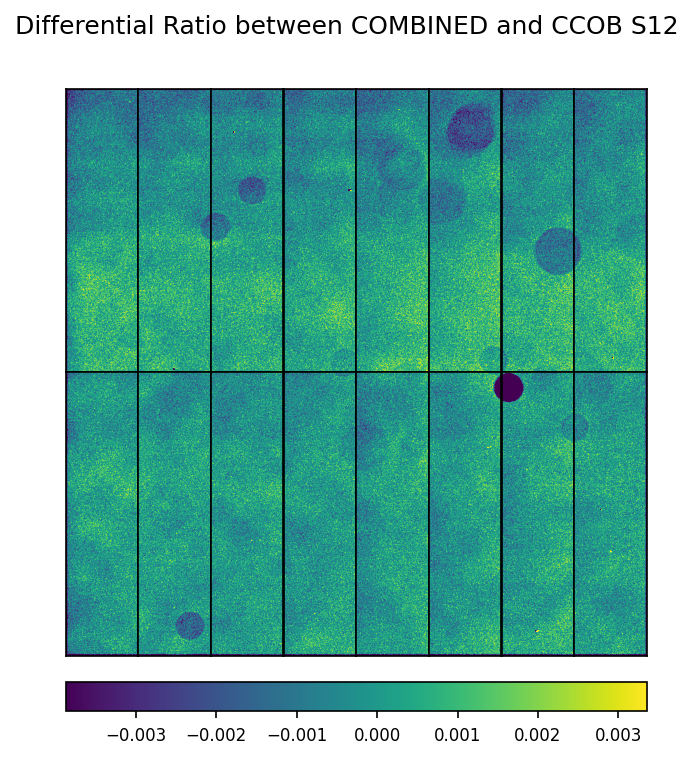

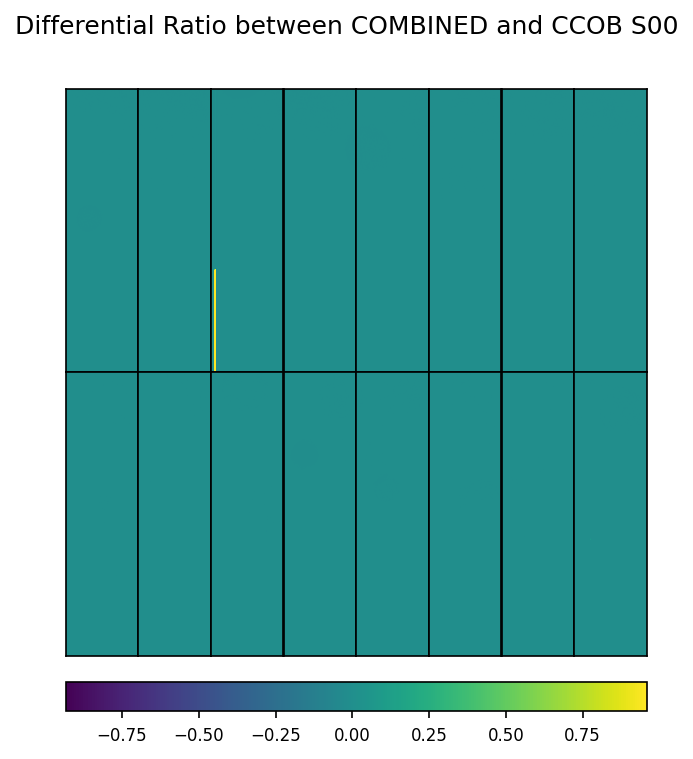

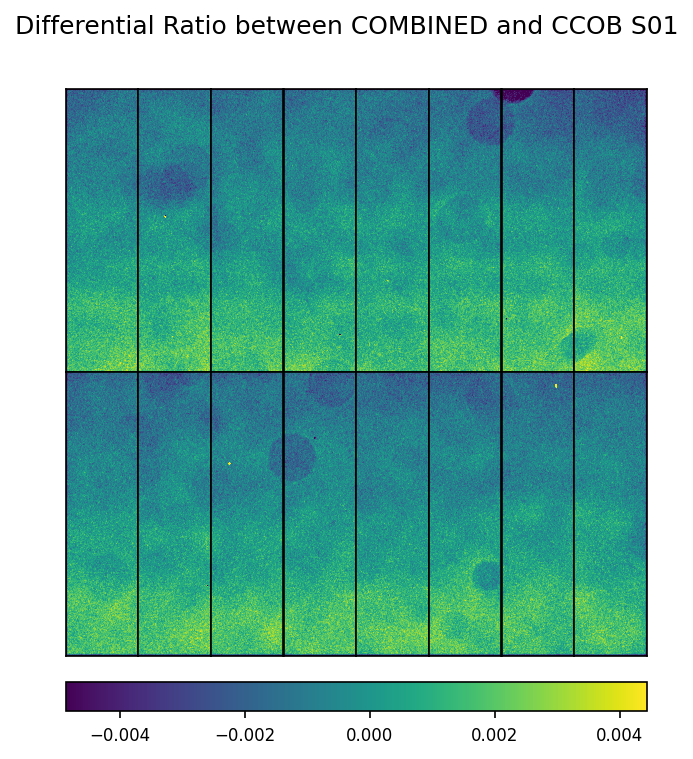

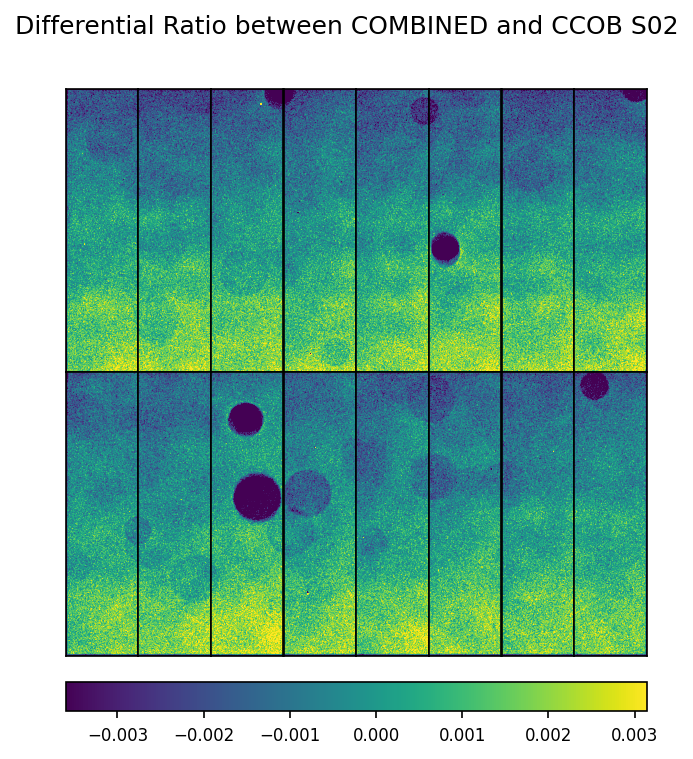

In [6]:
num_ch = 16
num_CCDs = 9
raft = 'R22'
filter_band = 'R'

relnorm_list_E2V = []
for i in range(num_CCDs):
    image_com = plotonesensor_E2V(normedimg_arr_list[i], 'COMBINED normalized against CCOB$_{R}$ ' + str(raft) + '_' + str(sensor_label[i]))
    com_relnorm = internaladjustment(image_com)

    image_com = plotonesensor_E2V(red_arr_list[i], 'CCOB$_{R}$ ' + str(raft) + '_' + str(sensor_label[i]))
    ccob_relnorm = internaladjustment(image_com)
    
    relnorm = com_relnorm/ccob_relnorm
    relnorm_list_E2V.append(relnorm)

for i in range(num_CCDs):
    diff_arr_E2V = [None] * num_ch
    for ch in range(num_ch):
        diff_arr_E2V[ch] = (normedimg_arr_list[i][ch] - red_arr_list[i][ch]) / red_arr_list[i][ch]
    sensor_label = ['S20', 'S21', 'S22', 'S10', 'S11', 'S12', 'S00', 'S01', 'S02']
    plotonesensor_E2V_andsave(diff_arr_E2V, sensor_label, raft, i, relativenorm=relnorm_list_E2V[i])
    
ratio_img_list = ['R22_S20.png', 'R22_S21.png', 'R22_S22.png', 'R22_S10.png', 'R22_S11.png', 'R22_S12.png', 'R22_S00.png', 'R22_S01.png', 'R22_S02.png']

In [ ]:
plotfullraft(raft, filter_band, ratio_img_list)